In [33]:
# Importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Importing important functions/algorithms
from sklearn.manifold import TSNE

In [2]:
df = pd.read_excel('./Patterns Project.xlsx', sheet_name='Original')  # ./  is for current directory and there is no need here for this but just for sake of understanding.Do change the path if file is somewhere else 

In [3]:
df.head()

,Line Code,Month,Date,EURKM vs Budget,EURKM vs Budget(abs),Plan Capacity,Plan Km,Plan Load,Plan Net Revenue per Bus Km,Plan Net Yield,...,YIELD vs Budget,YIELD vs Budget (abs),Km,Km Total,Net Revenue Per Km,Net Revenue Per Seat Km,Net Yield,Seat Km,Utilization (%),Outcome
0,1,1,2017,0.023122,0.033176,53.000862,114857,0.583000,1.434802,4.643446,...,0.020494,0.095164,114858.9,3558222.1,1.467977,0.029198,4.738610,5774745.2,0.616170,0
1,1,2,2017,-0.132650,-0.211710,50.001359,103028,0.700649,1.596003,4.555663,...,-0.047013,-0.214174,103030.8,3285158.4,1.384293,0.027453,4.341488,5195309.6,0.632332,0
2,1,3,2017,0.163055,0.229740,51.001362,113816,0.638601,1.408976,4.326056,...,0.064672,0.279776,113819.1,4049587.4,1.638716,0.032499,4.605832,5739253.6,0.705595,0
3,1,4,2017,0.169769,0.278225,50.998759,124902,0.686000,1.638845,4.684405,...,0.146088,0.684334,124898.9,4459891.7,1.917070,0.038194,5.368739,6269035.2,0.711416,0
4,1,5,2017,0.056917,0.085502,51.999176,137066,0.627200,1.502218,4.606067,...,0.109811,0.505796,137063.9,4257137.2,1.587720,0.031693,5.111863,6866404.7,0.619995,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22831 entries, 0 to 22830
Data columns (total 26 columns):
Line Code                      22831 non-null object
Month                          22831 non-null int64
Date                           22831 non-null int64
EURKM vs Budget                22421 non-null float64
EURKM vs Budget(abs)           22421 non-null float64
Plan Capacity                  22441 non-null float64
Plan  Km                       22831 non-null int64
Plan Load                      22441 non-null float64
Plan Net Revenue per Bus Km    22441 non-null float64
Plan Net Yield                 22423 non-null float64
Plan Pax Km                    22831 non-null int64
Plan Seat Km                   22831 non-null int64
SKM vs Budget                  22441 non-null float64
SKM vs Budget(abs)             22441 non-null float64
UTIL vs Budget                 22423 non-null float64
UTIL vs Budget (abs)           22423 non-null float64
YIELD vs Budget                22421 n

In [5]:
df.describe()   # Some columns have very high std(standard deviation error) which means they should be dealt with before preprocessing for model

,Month,Date,EURKM vs Budget,EURKM vs Budget(abs),Plan Capacity,Plan Km,Plan Load,Plan Net Revenue per Bus Km,Plan Net Yield,Plan Pax Km,...,YIELD vs Budget,YIELD vs Budget (abs),Km,Km Total,Net Revenue Per Km,Net Revenue Per Seat Km,Net Yield,Seat Km,Utilization (%),Outcome
count,22831.000000,22831.000000,22421.000000,22421.000000,22441.000000,22831.000000,22441.000000,22441.000000,22423.000000,2.283100e+04,...,22421.000000,22421.000000,22831.000000,2.283100e+04,22831.000000,22831.000000,22831.000000,2.283100e+04,22831.000000,22831.000000
mean,6.747273,2018.194735,-0.001725,-0.048463,54.490245,51830.204809,0.565135,1.486628,4.745389,1.722844e+06,...,0.016235,-0.177123,49664.515377,1.642622e+06,1.425633,0.025686,4.524891,2.832515e+06,0.532803,0.295213
std,3.375115,0.787724,0.508887,0.485943,23.634161,37821.740364,0.117718,0.851328,1.284120,1.961437e+06,...,0.881198,1.296406,37756.517776,1.751325e+06,0.882839,0.011066,1.740832,2.770321e+06,0.181587,0.456148
min,1.000000,2017.000000,-1.000000,-9.667131,19.975494,0.000000,0.000000,0.000000,0.000000,0.000000e+00,...,-1.000000,-18.500173,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
25%,4.000000,2018.000000,-0.155681,-0.228383,48.130141,30174.500000,0.500003,1.105292,4.137426,7.983725e+05,...,-0.085798,-0.412930,28560.270000,7.272003e+05,1.055965,0.020400,3.965144,1.432746e+06,0.472096,0.000000
50%,7.000000,2018.000000,-0.009038,-0.011545,49.012477,43916.000000,0.568541,1.381691,4.644370,1.320326e+06,...,0.003860,0.018346,43130.200000,1.289940e+06,1.385265,0.026201,4.639051,2.267225e+06,0.564207,0.000000
75%,10.000000,2019.000000,0.149559,0.192533,54.003739,63656.000000,0.641165,1.741116,5.252786,2.128926e+06,...,0.091472,0.412197,62702.000000,2.108328e+06,1.766882,0.031978,5.349114,3.524148e+06,0.646336,1.000000
max,12.000000,2019.000000,14.431777,4.741925,730.036259,427338.000000,0.961876,24.063893,27.221611,4.833879e+07,...,31.196276,4.883833,425402.800000,4.065796e+07,22.559918,0.090757,27.607777,5.244246e+07,0.964033,1.000000


In [6]:
df.isna().sum()   # Missing Values

Line Code                        0
Month                            0
Date                             0
EURKM vs Budget                410
EURKM vs Budget(abs)           410
Plan Capacity                  390
Plan  Km                         0
Plan Load                      390
Plan Net Revenue per Bus Km    390
Plan Net Yield                 408
Plan Pax Km                      0
Plan Seat Km                     0
SKM vs Budget                  390
SKM vs Budget(abs)             390
UTIL vs Budget                 408
UTIL vs Budget (abs)           408
YIELD vs Budget                410
YIELD vs Budget (abs)          410
Km                               0
Km Total                         0
Net Revenue Per Km               0
Net Revenue Per Seat Km          0
Net Yield                        0
Seat Km                          0
Utilization (%)                  0
Outcome                          0
dtype: int64

In [7]:
df_2 = df
df_2['Year_and_Month'] = df['Date'].astype('str') + '-' + df['Month'].astype('str')

In [8]:
# If below lines are commented out then the graphs plotted are a little bit different because below lines change index to month and year(date)

#df_2.drop(['Month', 'Date'], axis=1)
#df_2['Year_and_Month'] = pd.to_datetime(df_2['Year_and_Month'])  # Converting Year_and_month col into datetime.As default day is 01 but right now it wouldn't make a problem
#df_2 = df_2.set_index('Year_and_Month')

df_2.head()

,Line Code,Month,Date,EURKM vs Budget,EURKM vs Budget(abs),Plan Capacity,Plan Km,Plan Load,Plan Net Revenue per Bus Km,Plan Net Yield,...,YIELD vs Budget (abs),Km,Km Total,Net Revenue Per Km,Net Revenue Per Seat Km,Net Yield,Seat Km,Utilization (%),Outcome,Year_and_Month
0,1,1,2017,0.023122,0.033176,53.000862,114857,0.583000,1.434802,4.643446,...,0.095164,114858.9,3558222.1,1.467977,0.029198,4.738610,5774745.2,0.616170,0,2017-1
1,1,2,2017,-0.132650,-0.211710,50.001359,103028,0.700649,1.596003,4.555663,...,-0.214174,103030.8,3285158.4,1.384293,0.027453,4.341488,5195309.6,0.632332,0,2017-2
2,1,3,2017,0.163055,0.229740,51.001362,113816,0.638601,1.408976,4.326056,...,0.279776,113819.1,4049587.4,1.638716,0.032499,4.605832,5739253.6,0.705595,0,2017-3
3,1,4,2017,0.169769,0.278225,50.998759,124902,0.686000,1.638845,4.684405,...,0.684334,124898.9,4459891.7,1.917070,0.038194,5.368739,6269035.2,0.711416,0,2017-4
4,1,5,2017,0.056917,0.085502,51.999176,137066,0.627200,1.502218,4.606067,...,0.505796,137063.9,4257137.2,1.587720,0.031693,5.111863,6866404.7,0.619995,0,2017-5


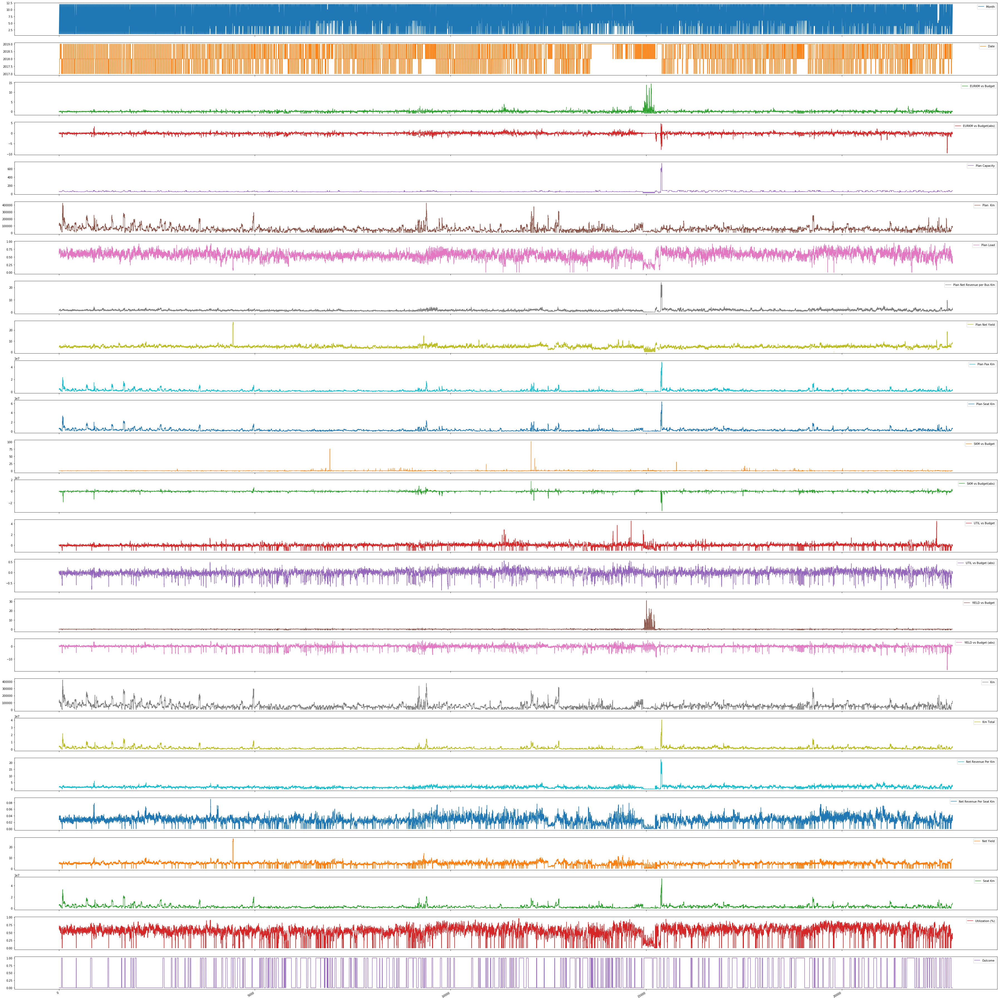

In [9]:
df_2.plot(subplots=True, figsize=[50, 50])
plt.tight_layout()
plt.show()

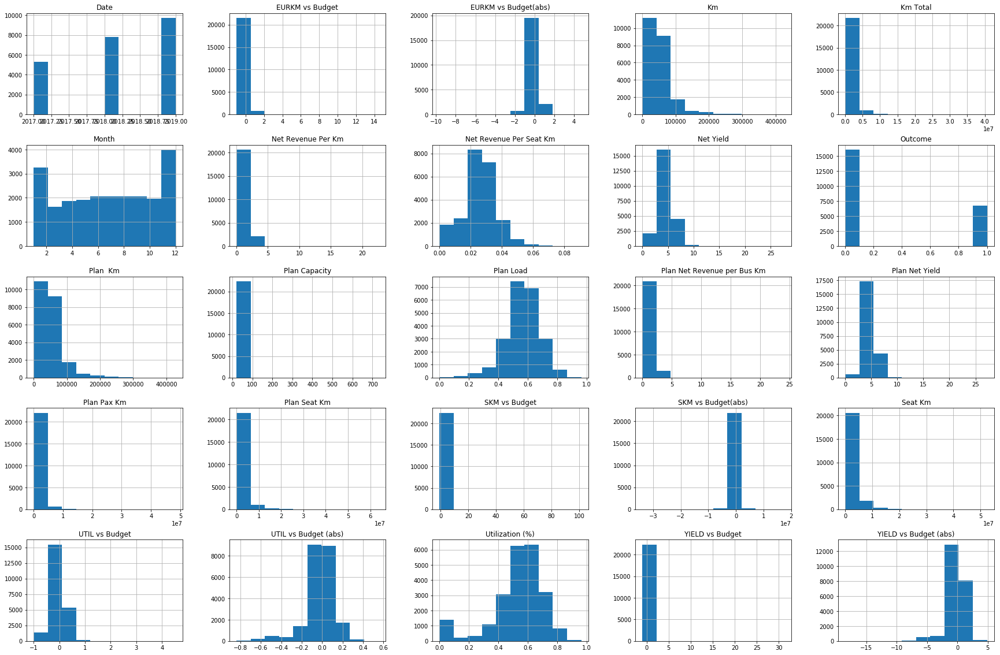

In [10]:
df_2.hist(figsize=[30,20]) # We can see that some value vary (Month and Date are of no value) 
plt.show()

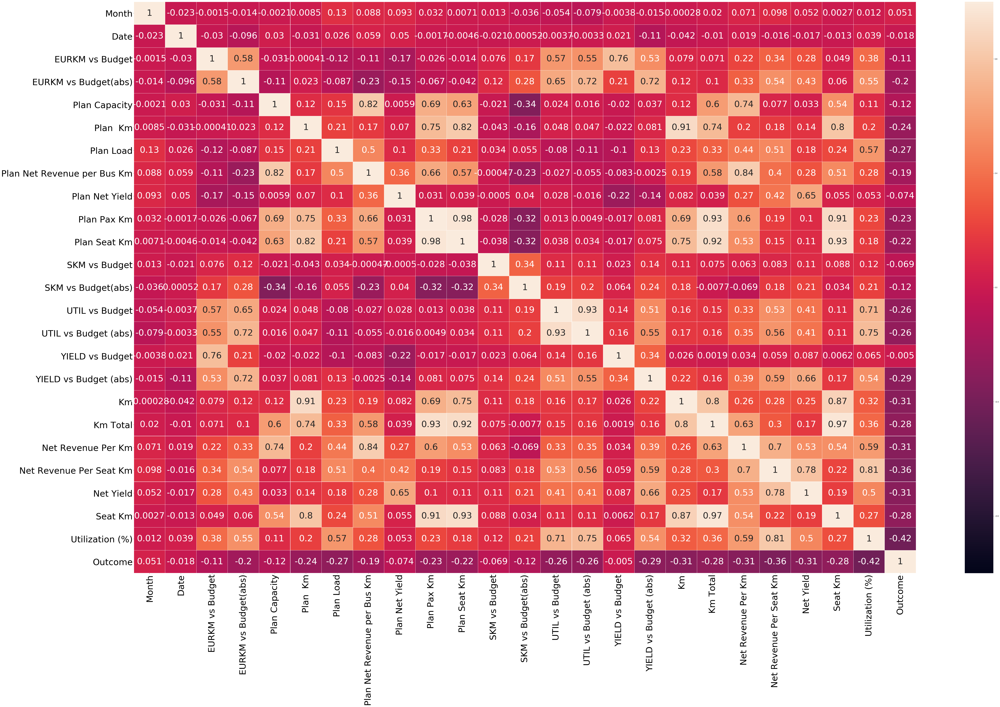

In [11]:
correlation = df_2.corr()

sns.heatmap(correlation, xticklabels=correlation.columns.values, yticklabels=correlation.columns.values, annot=True, annot_kws={'size':50}, linewidth=.10, vmin=-1, vmax=1)
heat_map = plt.gcf()
heat_map.set_size_inches(100, 60)
plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
plt.show()

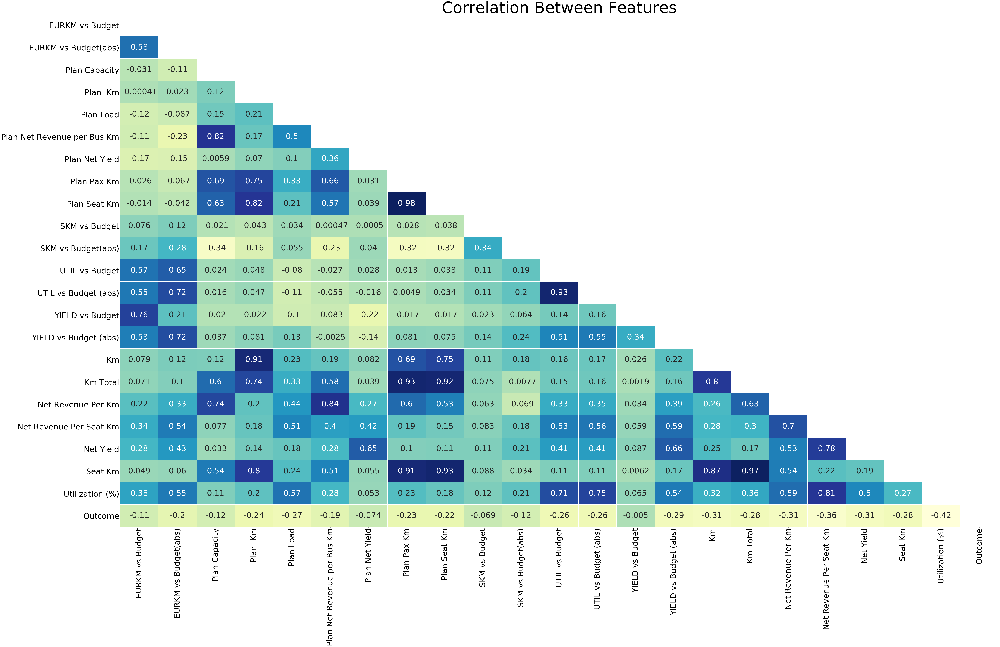

In [48]:
df_3 = df.drop(['Month', 'Date'], axis=1)

correlation = df_3.corr()  
#mask = np.triu(np.array(correlation))  # Triangular Matrix 
mask = np.triu(  np.ones_like(correlation, dtype=bool) )   

sns.heatmap(correlation, xticklabels=correlation.columns.values, yticklabels=correlation.columns.values, annot=True, annot_kws={'size':50}, linewidth=.30, mask=mask, cmap="YlGnBu", cbar=False) # annot_kws->size is of the numbers in boxes, mask applies the triangular matrix, linewidth is the the space between boxes
heat_map = plt.gcf()  # Get Current Figure
heat_map.set_size_inches(100, 60)
plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
plt.title('Correlation Between Features', fontsize=100)
plt.savefig('correlation-heatmap.png')
plt.show()
# Range between -1 and +1

In [27]:
df_4 = df_2

df_4.drop(['Month', 'Date'], axis=1)
df_4['Year_and_Month'] = pd.to_datetime(df_2['Year_and_Month'])  # Converting Year_and_month col into datetime.As default day is 01 but right now it wouldn't make a problem
df_4 = df_4.set_index('Year_and_Month')

df_4.dropna(inplace=True)

/home/muhammadammarabid/Desktop/S/softwares/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/muhammadammarabid/Desktop/S/softwares/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/muhammadammarabid/Desktop/S/softwares/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/home/muhammadammarabid/Desktop/S/softwares/anaconda3/lib/python3.7/site-packages/numpy/core/fromn

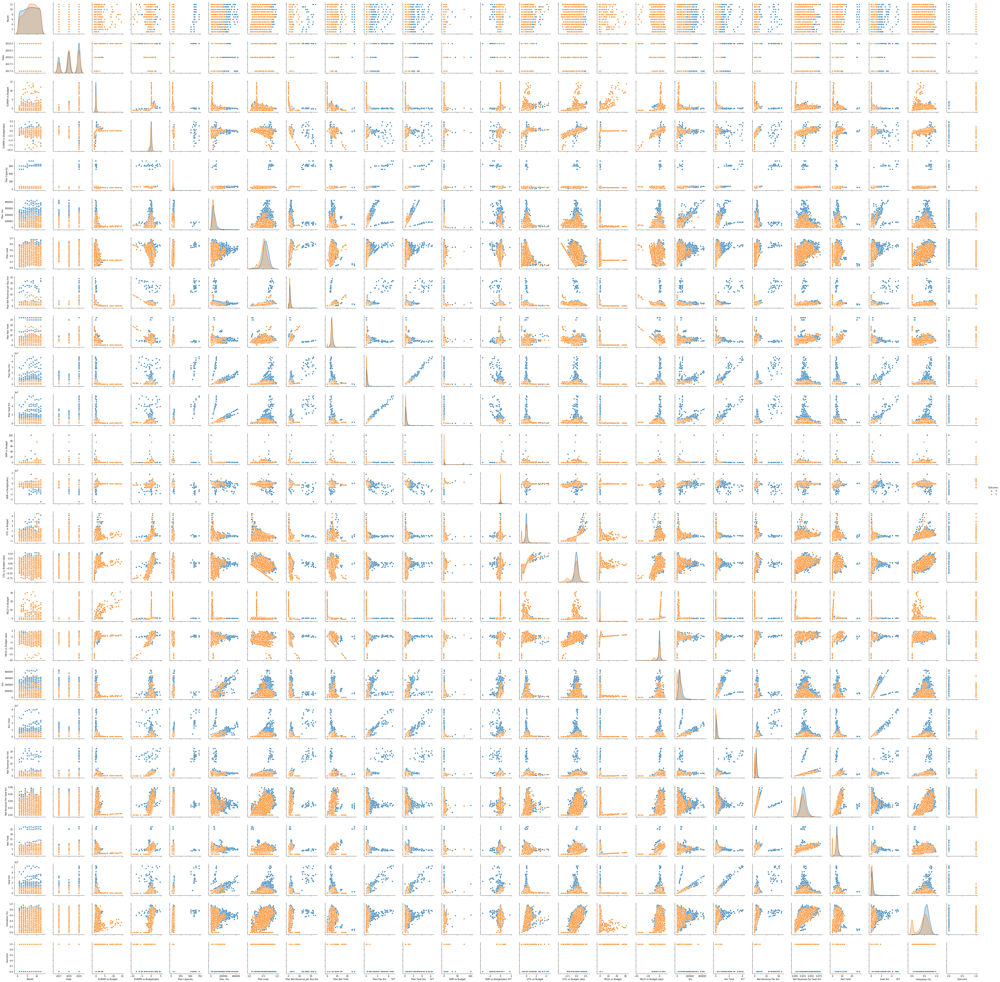

In [32]:
sns.pairplot(df_4, hue='Outcome')
plt.show()

In [57]:
df_5 = df_4.drop('Line Code', axis=1)  # Just need to see the relation between other features

tsne = TSNE(learning_rate=50)
tsne_features = tsne.fit_transform(df_5)

In [58]:
tsne_features[1:4, :]

array([[ 21.3116   , -39.95227  ],
       [ 14.812501 , -42.22161  ],
       [  3.7405748, -41.590176 ]], dtype=float32)

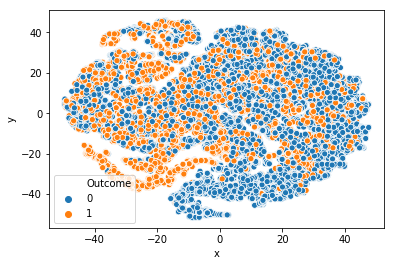

In [59]:
df_5['x'] = tsne_features[:, 0]
df_5['y'] = tsne_features[:, 1]

sns.scatterplot(x='x', y='y', hue='Outcome', data=df_5)  # Can change hue column to see the where other columns lie and it could give a insight
plt.show()

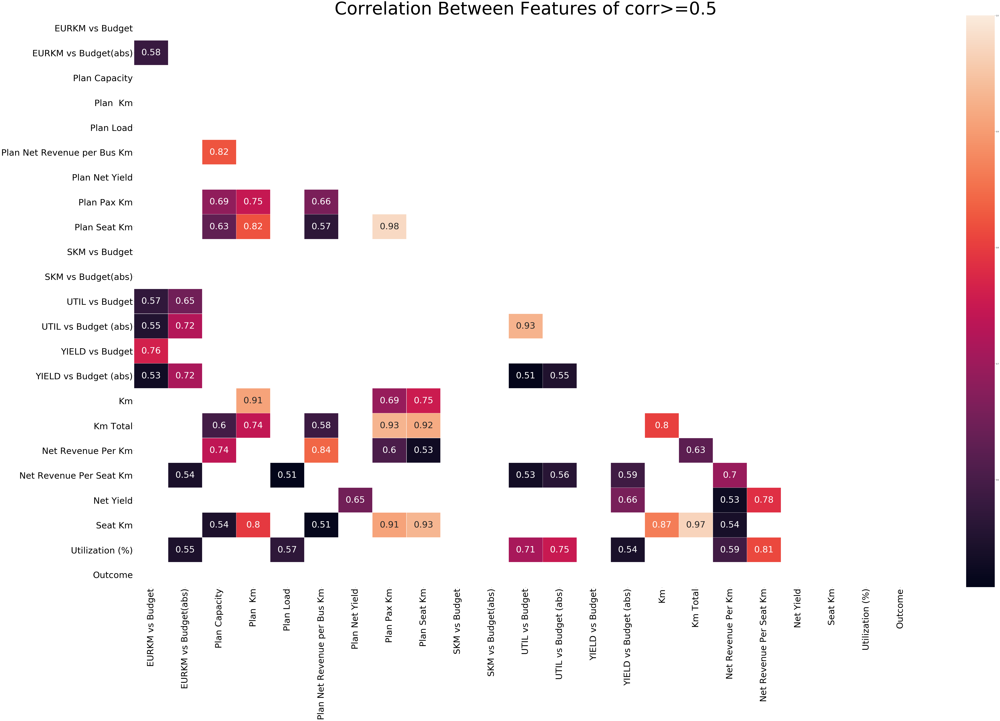

In [56]:
corr_gte_0p5 = correlation[correlation >= 0.5]
mask = np.triu( np.array(corr_gte_0p5) )

sns.heatmap(corr_gte_0p5, xticklabels=corr_gte_0p5.columns.values, yticklabels=corr_gte_0p5.columns.values, annot=True, annot_kws={'size':50}, linewidth=.30, mask=mask) # annot_kws->size is of the numbers in boxes, mask applies the triangular matrix, linewidth is the the space between boxes
heat_map = plt.gcf()  # Get Current Figure
heat_map.set_size_inches(100, 60)
plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
plt.title('Correlation Between Features of corr>=0.5', fontsize=100)
plt.show()